### The aim of this project is to predict the average price of the avocadoes and also to find the region of sales. First the data has been cleaned and then analysis has been carried out.For prediction, regression model and classification models are built respectively.

Steps followed in the project:
    
1) Importing the packages/libraries

2) Reading the dataset

3) Checking the shape

4) Checking the info

5) Data cleaning( Treating the missing values, dropping unwanted columns/rows)

6) Exploratory data analysis

7) Outlier treatment

8) Label encoding/One hot encoding

9) Defining X and y(independent and dependent variable)

10) Splitting the data into train and test

11) Fitting different models

12) Checking the metrics for model evaluation

In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [32]:
df=pd.read_csv("avocado (1).txt")
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015.0,Albany


In [33]:
#Checking the whole dataset.
pd.set_option("display.max_rows", None, "display.max_columns", None)
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015.0,Albany
5,5.0,22-11-2015,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015.0,Albany
6,6.0,15-11-2015,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015.0,Albany
7,7.0,08-11-2015,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015.0,Albany
8,8.0,01-11-2015,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015.0,Albany
9,9.0,25-10-2015,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015.0,Albany


In [34]:
df.shape

(16468, 14)

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16468 entries, 0 to 16467
Data columns (total 14 columns):
Unnamed: 0      1517 non-null float64
Date            1517 non-null object
AveragePrice    1517 non-null float64
Total Volume    1517 non-null float64
4046            1517 non-null float64
4225            1517 non-null float64
4770            1517 non-null float64
Total Bags      1517 non-null float64
Small Bags      1517 non-null float64
Large Bags      1517 non-null float64
XLarge Bags     1517 non-null float64
type            1517 non-null object
year            1517 non-null float64
region          1517 non-null object
dtypes: float64(11), object(3)
memory usage: 1.8+ MB


In [36]:
#We see that from 1518th row, all are NaN values. Hence dropping rows containing NaN values.
df.dropna(inplace=True)

In [37]:
df.shape

(1517, 14)

In [38]:
round((((df.isnull().sum())/len(df))*100),2)

Unnamed: 0      0.0
Date            0.0
AveragePrice    0.0
Total Volume    0.0
4046            0.0
4225            0.0
4770            0.0
Total Bags      0.0
Small Bags      0.0
Large Bags      0.0
XLarge Bags     0.0
type            0.0
year            0.0
region          0.0
dtype: float64

In [39]:
df.type.value_counts()

conventional    1517
Name: type, dtype: int64

In [40]:
df.drop(['Unnamed: 0','Date','type'],axis=1,inplace=True)

## Checking Outliers

In [41]:
df.skew()

AveragePrice   -0.109444
Total Volume    6.200138
4046            6.051830
4225            6.394926
4770            5.405164
Total Bags      5.366378
Small Bags      5.355185
Large Bags      5.144495
XLarge Bags     5.775077
year            1.828332
dtype: float64

## Removing the outliers

In [42]:
df1=df[(df["4225"]>(np.mean(df["4225"])-3*np.std(df["4225"])))
             & (df["4225"]<(np.mean(df["4225"])+3*np.std(df["4225"])))]

In [43]:
df1.shape

(1492, 11)

In [44]:
df2=df1[(df1["XLarge Bags"]>(np.mean(df1["XLarge Bags"])-3.5*np.std(df1["XLarge Bags"])))
             & (df1["XLarge Bags"]<(np.mean(df1["XLarge Bags"])+3*np.std(df1["XLarge Bags"])))]

In [45]:
df2.shape

(1448, 11)

In [46]:
df2.skew()

AveragePrice   -0.167917
Total Volume    2.620734
4046            2.967150
4225            2.348712
4770            3.259416
Total Bags      4.091435
Small Bags      4.376696
Large Bags      4.574104
XLarge Bags     4.889420
year            1.994701
dtype: float64

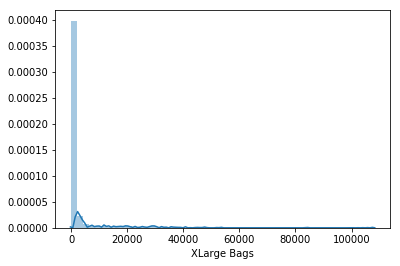

In [47]:
sns.distplot(df['XLarge Bags'])
plt.show()

In [48]:
df3=df2[(df2["Large Bags"]>(np.mean(df2["Large Bags"])-3*np.std(df2["Large Bags"])))
             & (df2["Large Bags"]<(np.mean(df2["Large Bags"])+3*np.std(df2["Large Bags"])))]

In [49]:
df3.shape

(1412, 11)

In [50]:
df3.skew()

AveragePrice   -0.205515
Total Volume    2.955621
4046            3.422859
4225            2.522471
4770            3.553380
Total Bags      4.292689
Small Bags      4.549477
Large Bags      2.962787
XLarge Bags     5.277151
year            2.016503
dtype: float64

In [51]:
#Since the percentage loss of data shouldn't be more, we stop removing outliers here.
print("Percentage loss of data:",(np.round((1517-1412)*100/1517)),"%")

Percentage loss of data: 7.0 %


In [52]:
np.isnan(df3.values.any())

False

In [53]:
df3['region'].value_counts()

Albany                 67
BaltimoreWashington    65
Boise                  65
Boston                 62
Atlanta                54
PhoenixTucson          52
BuffaloRochester       51
Spokane                49
Columbus               47
NewYork                44
Jacksonville           41
SanDiego               38
Detroit                37
SouthCentral           37
Tampa                  34
Louisville             34
California             34
Charlotte              31
Portland               30
NorthernNewEngland     29
Houston                29
WestTexNewMexico       27
Nashville              25
SouthCarolina          24
Denver                 24
GrandRapids            23
Chicago                23
Pittsburgh             22
Orlando                21
RichmondNorfolk        21
HarrisburgScranton     19
Syracuse               19
Midsouth               18
Roanoke                17
MiamiFtLauderdale      17
DallasFtWorth          17
StLouis                16
RaleighGreensboro      16
Indianapolis

In [54]:
df3.year.value_counts()

2015.0    1207
2016.0     205
Name: year, dtype: int64

In [55]:
df3.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'region'],
      dtype='object')

In [56]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1412 entries, 0 to 1516
Data columns (total 11 columns):
AveragePrice    1412 non-null float64
Total Volume    1412 non-null float64
4046            1412 non-null float64
4225            1412 non-null float64
4770            1412 non-null float64
Total Bags      1412 non-null float64
Small Bags      1412 non-null float64
Large Bags      1412 non-null float64
XLarge Bags     1412 non-null float64
year            1412 non-null float64
region          1412 non-null object
dtypes: float64(10), object(1)
memory usage: 132.4+ KB


## EDA

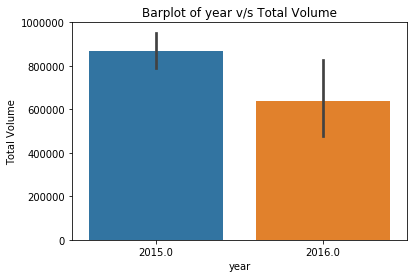

In [57]:
sns.barplot(df3.year,df3['Total Volume'])
plt.title("Barplot of year v/s Total Volume")
plt.show()

From the above barplot, Total volume of avocadoes sold is more in 2015 as compared to 2016

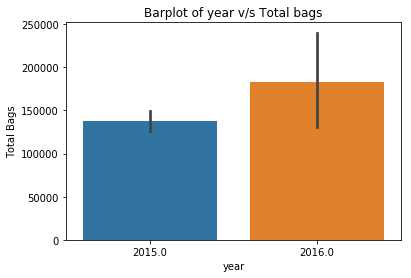

In [58]:
sns.barplot(df3.year,df3['Total Bags'])
plt.title("Barplot of year v/s Total bags")
plt.show()

From the above barplot, it can be seen that Total bags sold is greater in 2015 as compared to 2016

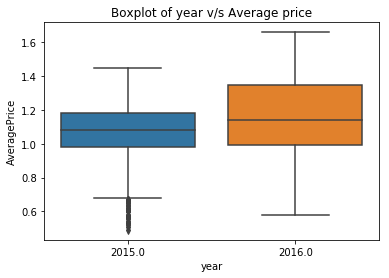

In [59]:
sns.boxplot(df3.year,df3.AveragePrice)
plt.title("Boxplot of year v/s Average price")
plt.show()

From the above boxplot, it can be seen that Average price is more in 2016 as compared to 2015.

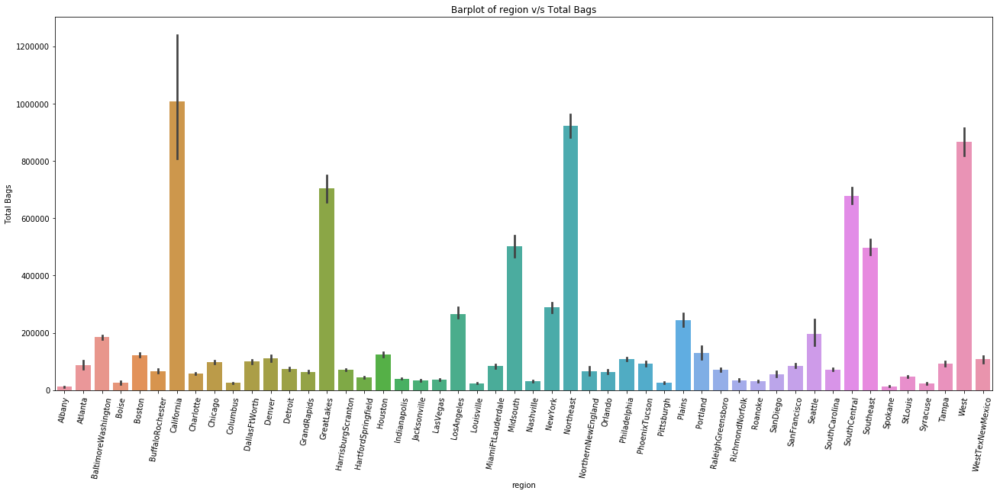

In [60]:
plt.figure(figsize=(22,9))
sns.barplot(df3['region'],df3['Total Bags'])
plt.title("Barplot of region v/s Total Bags")
plt.xticks(rotation=80)
plt.show()

From the above barplot, it can be observed that Total bags sold are highest in BuffaloRochester followed by North-east West

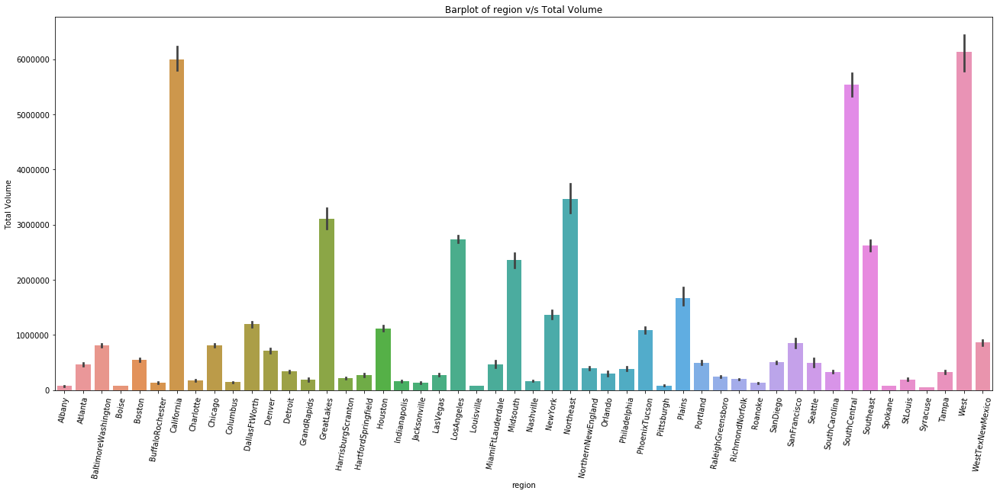

In [61]:
plt.figure(figsize=(22,9))
sns.barplot(df3['region'],df3['Total Volume'])
plt.title("Barplot of region v/s Total Volume")
plt.xticks(rotation=80)
plt.show()

From the above barplot, it can be observed that Total volume sold are highest in California and  West followed by South Central

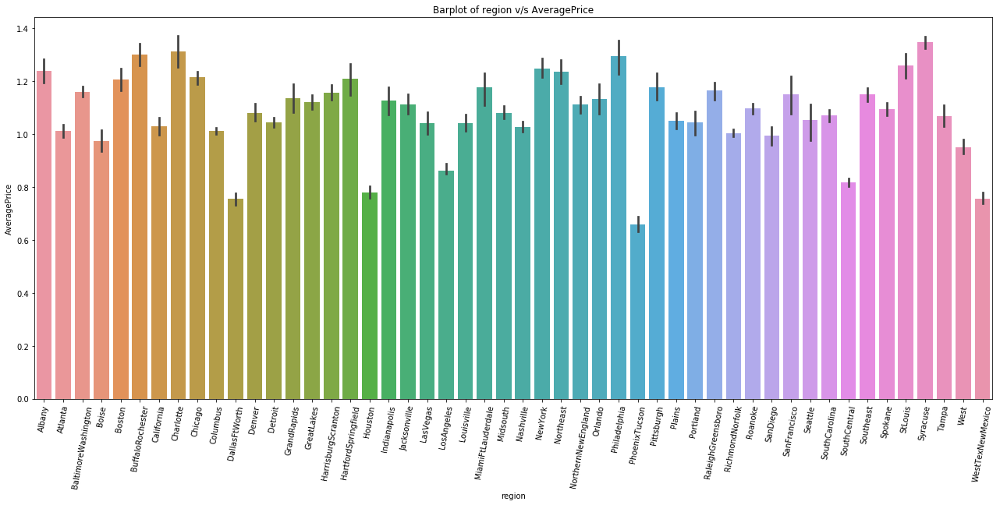

In [62]:
plt.figure(figsize=(22,9))
sns.barplot(df3['region'],df3['AveragePrice'])
plt.title("Barplot of region v/s AveragePrice")
plt.xticks(rotation=80)
plt.show()

From the above barplot, it can be observed that Average price is the least in Phoenix Tucson and on an average averageprice varies between 1 to 1.2 units

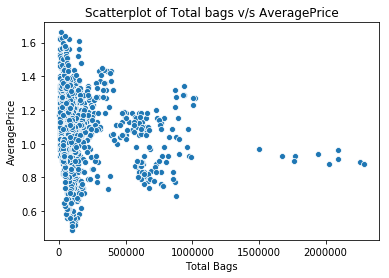

In [63]:
sns.scatterplot(df3['Total Bags'],df3['AveragePrice'])
plt.title("Scatterplot of Total bags v/s AveragePrice")
plt.show()

From the above scatter plot it can be seen that, for the highest of total bags,iefrom 1500000 to 2000000 bags averageprice varies between 0.8 to 1.0 units

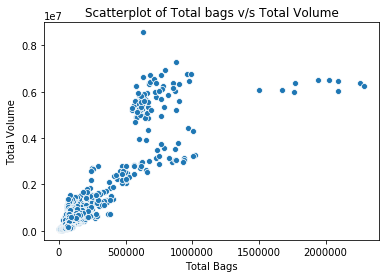

In [64]:
sns.scatterplot(df3['Total Bags'],df3['Total Volume'])
plt.title("Scatterplot of Total bags v/s Total Volume")
plt.show()

From the above scatter plot it can be seen that,Total volume is positively correlated till total bags reach 1000000. From Bagcount of 1500000 to 2000000, total volume lies between 0.6 to 0.7 units.

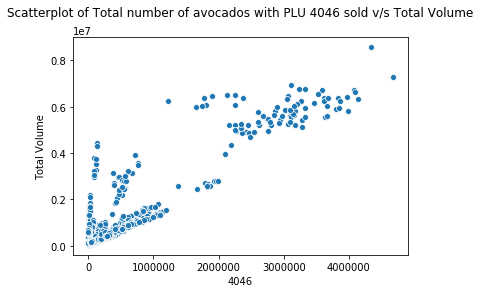

In [65]:
sns.scatterplot(df3['4046'],df3['Total Volume'])
plt.title("Scatterplot of Total number of avocados with PLU 4046 sold v/s Total Volume\n")
plt.show()

From the above scatter plot it can be seen that,total number of avocados with PLU 4046 sold is positively correlated with total volume.

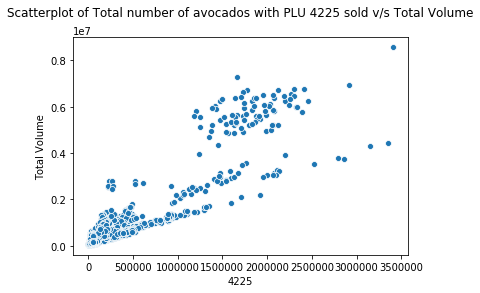

In [66]:
sns.scatterplot(df3['4225'],df3['Total Volume'])
plt.title("Scatterplot of Total number of avocados with PLU 4225 sold v/s Total Volume\n")
plt.show()

From the above scatter plot it can be observed that,total number of avocados with PLU 4225 sold is positively correlated with total volume.

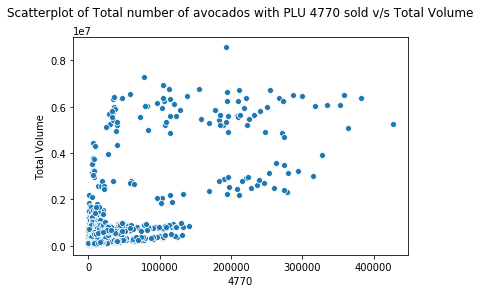

In [67]:
sns.scatterplot(df3['4770'],df3['Total Volume'])
plt.title("Scatterplot of Total number of avocados with PLU 4770 sold v/s Total Volume\n")
plt.show()

From the above scatter plot it can be observed  that, There is weak positive correlation between Total number of avocdoes with PLU 4770 sold with Total volume

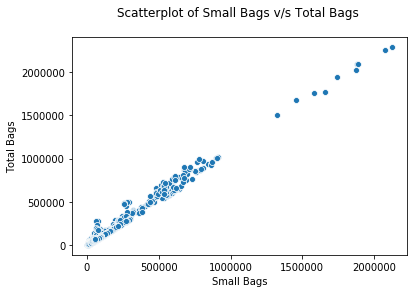

In [68]:
sns.scatterplot(df3['Small Bags'],df3['Total Bags'])
plt.title("Scatterplot of Small Bags v/s Total Bags \n")
plt.show()

From the above scatter plot it can be observed  that, there is strong positive correlation between Small bags with Total bags

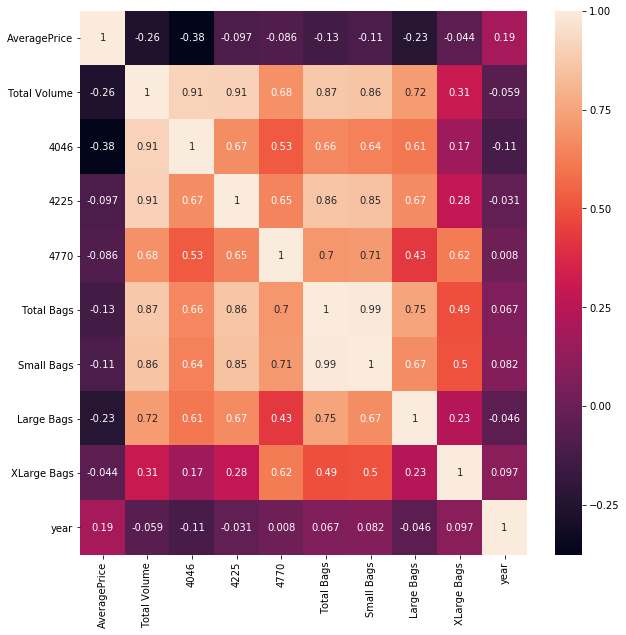

In [69]:
#Checking the correlation using heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df3.corr(),annot=True)
plt.show()

## Label Encoding and One hot encoding of categorical data

In [70]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [73]:
df3['year']=le.fit_transform(df3['year'])

In [81]:
df3.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'region'],
      dtype='object')

In [82]:
df4=df3

In [83]:
df4['region']=le.fit_transform(df4['region'])

In [84]:
df4.region.value_counts()

0     67
2     65
3     65
4     62
1     54
31    52
5     51
44    49
9     47
26    44
19    41
38    38
42    37
12    37
47    34
22    34
6     34
7     31
34    30
28    29
17    29
49    27
25    25
41    24
11    24
13    23
8     23
32    22
36    21
29    21
15    19
46    19
24    18
37    17
23    17
10    17
45    16
18    16
35    16
39    15
16    13
30    13
14    13
33    12
27    12
48    11
20    10
40     9
43     6
21     3
Name: region, dtype: int64

In [85]:
status=pd.get_dummies(df3['region'],drop_first=True,prefix='Region')
df3=pd.concat([df3,status],axis=1)
df3.drop('region',axis=1,inplace=True)

## Applying logsccale

In [86]:
for col in df3.columns:
    if df3[col].skew()>0.55:
        df3[col]=np.log1p(df3[col])

# Model for predicting average price

In [87]:
X=df3.drop('AveragePrice',axis=1)
X.columns

Index(['Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags',
       'Large Bags', 'XLarge Bags', 'year', 'Region_1', 'Region_2', 'Region_3',
       'Region_4', 'Region_5', 'Region_6', 'Region_7', 'Region_8', 'Region_9',
       'Region_10', 'Region_11', 'Region_12', 'Region_13', 'Region_14',
       'Region_15', 'Region_16', 'Region_17', 'Region_18', 'Region_19',
       'Region_20', 'Region_21', 'Region_22', 'Region_23', 'Region_24',
       'Region_25', 'Region_26', 'Region_27', 'Region_28', 'Region_29',
       'Region_30', 'Region_31', 'Region_32', 'Region_33', 'Region_34',
       'Region_35', 'Region_36', 'Region_37', 'Region_38', 'Region_39',
       'Region_40', 'Region_41', 'Region_42', 'Region_43', 'Region_44',
       'Region_45', 'Region_46', 'Region_47', 'Region_48', 'Region_49'],
      dtype='object')

In [88]:
y=df3['AveragePrice']
y.head()

0    1.33
1    1.35
2    0.93
3    1.08
4    1.28
Name: AveragePrice, dtype: float64

In [89]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=101)

## Linear Regression

In [90]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

In [91]:
lr.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [92]:
y_pred_train=lr.predict(X_train)

In [93]:
from sklearn.metrics import r2_score
print("r2_score using Linear regression:",r2_score(y_train,y_pred_train))

r2_score using Linear regression: 0.8189604451545424


In [94]:
y_pred_test=lr.predict(X_test)

In [95]:
from sklearn.metrics import r2_score
print("r2_score using Linear regression:",r2_score(y_test,y_pred_test))

r2_score using Linear regression: 0.7842848721626827


In [96]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score,classification_report,confusion_matrix
from math import sqrt
print("Root mean square error:",sqrt(mean_squared_error(y_test,y_pred_test)))
print("Mean absolute error:",mean_absolute_error(y_test,y_pred_test))

Root mean square error: 0.09007807952203621
Mean absolute error: 0.06660778798490108


## K Nearest Neighbours Regressor

In [97]:
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor(n_neighbors=3)

In [98]:
knr.fit(X_train,y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=3, p=2,
          weights='uniform')

In [99]:
y_pred_train=knr.predict(X_train)

In [100]:
print("r2_score using KNR:",r2_score(y_train,y_pred_train))

r2_score using KNR: 0.8856790404718877


In [101]:
y_pred_test=knr.predict(X_test)

In [102]:
print("r2_score using KNR:",r2_score(y_test,y_pred_test))

r2_score using KNR: 0.7571446482328541


In [103]:
print("Root mean square error:",sqrt(mean_squared_error(y_test,y_pred_test)))
print("Mean absolute error:",mean_absolute_error(y_test,y_pred_test))

Root mean square error: 0.09557683749647763
Mean absolute error: 0.06845125786163522


## SVR

In [104]:
from sklearn.svm import SVR
svr=SVR()

In [105]:
svr.fit(X_train,y_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [106]:
y_pred_train=svr.predict(X_train)

In [107]:
print("r2_score using SVR:",r2_score(y_train,y_pred_train))

r2_score using SVR: 0.7383952783170931


In [108]:
y_pred_test=svr.predict(X_test)

In [109]:
print("r2_score using KNR:",r2_score(y_test,y_pred_test))

r2_score using KNR: 0.6918325174963864


In [110]:
print("Root mean square error:",sqrt(mean_squared_error(y_test,y_pred_test)))
print("Mean absolute error:",mean_absolute_error(y_test,y_pred_test))

Root mean square error: 0.10766442424902481
Mean absolute error: 0.08039878540774709


#### From the performance of all the above models, we can select Linear Regression as the best model as it has good r2_score for test as well as train and good rmse,mae values as compared to other models.

# Model for predicting Region

In [111]:
#using df4 as dataframe as 'Region' was label encoded
for col in df4.columns:
    if df4[col].skew()>0.55:
        df4[col]=np.log1p(df4[col])

In [112]:
#Making Region as target column
X=df4.drop('region',axis=1)
X.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year'],
      dtype='object')

In [113]:
y=df4.region
y.head()

0    0
1    0
2    0
3    0
4    0
Name: region, dtype: int32

In [114]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=101)

## Logistic regression

In [115]:
from sklearn.linear_model import LogisticRegression
lgr=LogisticRegression()

In [116]:
lgr.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [117]:
y_pred_train=lgr.predict(X_train)

In [145]:
print("Accuracy using Logistic regression for train data:",accuracy_score(y_train,y_pred_train))

Accuracy using Logistic regression for train data: 1.0


In [146]:
print("Confusion matrix using Logistic regression for train data:",confusion_matrix(y_train,y_pred_train))

Confusion matrix using Logistic regression for train data: [[43  0  0 ...  0  0  0]
 [ 0 44  0 ...  0  0  0]
 [ 0  0 47 ...  0  0  0]
 ...
 [ 0  0  0 ... 24  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 19]]


In [147]:
print("Classification report using Logistic regression for train data:\n",classification_report(y_train,y_pred_train))

Classification report using Logistic regression for train data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        43
           1       1.00      1.00      1.00        44
           2       1.00      1.00      1.00        47
           3       1.00      1.00      1.00        44
           4       1.00      1.00      1.00        44
           5       1.00      1.00      1.00        36
           6       1.00      1.00      1.00        23
           7       1.00      1.00      1.00        24
           8       1.00      1.00      1.00        17
           9       1.00      1.00      1.00        34
          10       1.00      1.00      1.00        10
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        26
          13       1.00      1.00      1.00        16
          14       1.00      1.00      1.00        10
          15       1.00      1.00      1.00        14
          16    

In [143]:
y_pred_test=lgr.predict(X_test)

In [149]:
print("Accuracy using Logistic regression for test data:\n",accuracy_score(y_test,y_pred_test))

Accuracy using Logistic regression for test data:
 0.7570754716981132


In [150]:
print("Confusion matrix using Logistic regression for test data:\n",confusion_matrix(y_test,y_pred_test))

Confusion matrix using Logistic regression for test data:
 [[20  0  0 ...  0  0  0]
 [ 0  9  0 ...  0  0  0]
 [ 0  0 18 ...  0  0  0]
 ...
 [ 0  0  0 ...  9  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  7]]


In [151]:
print("Classification report Logistic regression for test data:\n",classification_report(y_test,y_pred_test))

Classification report Logistic regression for test data:
               precision    recall  f1-score   support

           0       0.87      0.83      0.85        24
           1       0.56      0.90      0.69        10
           2       0.69      1.00      0.82        18
           3       1.00      0.71      0.83        21
           4       0.83      0.83      0.83        18
           5       1.00      0.87      0.93        15
           6       0.79      1.00      0.88        11
           7       0.67      0.86      0.75         7
           8       1.00      1.00      1.00         6
           9       0.77      0.77      0.77        13
          10       1.00      0.14      0.25         7
          11       1.00      1.00      1.00         7
          12       1.00      1.00      1.00        11
          13       0.70      1.00      0.82         7
          14       1.00      0.33      0.50         3
          15       0.83      1.00      0.91         5
          16       0.00

## Random Forest

In [125]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(criterion='entropy',random_state=103)

In [126]:
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=103, verbose=0, warm_start=False)

In [127]:
y_pred_train=rfc.predict(X_train)

In [152]:
print("Accuracy using Random Forest for train data:\n",accuracy_score(y_train,y_pred_train))

Accuracy using Random Forest for train data:
 1.0


In [153]:
print("Confusion matrix using Random Forest for train data:\n",confusion_matrix(y_train,y_pred_train))

Confusion matrix using Random Forest for train data:
 [[43  0  0 ...  0  0  0]
 [ 0 44  0 ...  0  0  0]
 [ 0  0 47 ...  0  0  0]
 ...
 [ 0  0  0 ... 24  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 19]]


In [154]:
print("Classification report using Random Forest for train data:\n",classification_report(y_train,y_pred_train))

Classification report using Random Forest for train data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        43
           1       1.00      1.00      1.00        44
           2       1.00      1.00      1.00        47
           3       1.00      1.00      1.00        44
           4       1.00      1.00      1.00        44
           5       1.00      1.00      1.00        36
           6       1.00      1.00      1.00        23
           7       1.00      1.00      1.00        24
           8       1.00      1.00      1.00        17
           9       1.00      1.00      1.00        34
          10       1.00      1.00      1.00        10
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        26
          13       1.00      1.00      1.00        16
          14       1.00      1.00      1.00        10
          15       1.00      1.00      1.00        14
          16       1.0

In [131]:
y_pred_test=rfc.predict(X_test)

In [132]:
print("Accuracy score using Random forest for test data:\n",accuracy_score(y_test,y_pred_test))

0.9457547169811321

In [155]:
print("Confusion matrix using Random forest for test data:\n",confusion_matrix(y_test,y_pred_test))

Confusion matrix using Random forest for test data:
 [[20  0  0 ...  0  0  0]
 [ 0  9  0 ...  0  0  0]
 [ 0  0 18 ...  0  0  0]
 ...
 [ 0  0  0 ...  9  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  7]]


In [156]:
print("Classification using Random forest for test data:\n",classification_report(y_test,y_pred_test))

Classification using Random forest for test data:
               precision    recall  f1-score   support

           0       0.87      0.83      0.85        24
           1       0.56      0.90      0.69        10
           2       0.69      1.00      0.82        18
           3       1.00      0.71      0.83        21
           4       0.83      0.83      0.83        18
           5       1.00      0.87      0.93        15
           6       0.79      1.00      0.88        11
           7       0.67      0.86      0.75         7
           8       1.00      1.00      1.00         6
           9       0.77      0.77      0.77        13
          10       1.00      0.14      0.25         7
          11       1.00      1.00      1.00         7
          12       1.00      1.00      1.00        11
          13       0.70      1.00      0.82         7
          14       1.00      0.33      0.50         3
          15       0.83      1.00      0.91         5
          16       0.00      0

#### From the performance of the above models, we can go ahead with random forest as its giving the best parameter values as compared to other algorithms.

## Serialization

In [135]:
import pickle
Avocado_avgprice_model = pickle.dumps(lr)

In [136]:
lr_from_pickle = pickle.loads(Avocado_avgprice_model)

In [137]:
lr_from_pickle.predict(X_test)

ValueError: shapes (424,10) and (58,) not aligned: 10 (dim 1) != 58 (dim 0)

In [138]:
import pickle
Avocado_region_model = pickle.dumps(rfc)

In [139]:
rfc_from_pickle = pickle.loads(Avocado_region_model)

In [140]:
rfc_from_pickle.predict(X_test)

array([ 5, 22,  6, 10, 21, 22,  3,  0, 22,  4, 12,  2, 17,  3, 49,  1, 26,
        3, 23, 34, 17, 19,  9, 22, 28, 42, 17, 25, 17, 11,  2, 15, 18, 37,
        2, 13,  9, 37,  0, 22,  3, 49, 10, 31,  5, 24, 25, 38,  9, 47, 41,
        5, 44,  2, 41, 26, 44,  5,  1,  0,  0,  7, 13, 31,  4, 47, 32,  6,
       44, 31, 40,  2, 11, 30, 44, 24,  3, 19,  4, 34, 48,  0,  0,  5, 30,
       26, 27, 31, 27, 32,  4, 39, 11, 38, 23,  1, 43, 47, 44, 29, 44,  0,
       34,  3, 34, 26, 38, 44, 28, 44, 45,  3,  3, 19,  1,  4, 22,  4, 31,
        3, 15,  4,  7,  7,  6, 10,  2,  8, 31, 34, 26,  2,  4, 44, 38,  3,
       39, 20, 29,  1,  3, 42,  3, 38, 19,  4, 43,  3,  6,  8, 28, 19, 11,
       39, 26,  2, 41,  4,  0,  3, 47, 26, 47,  0, 34,  6, 44, 25, 36, 19,
       44,  0,  0, 22, 42, 41, 25, 13,  0, 38,  7, 20,  5, 30, 41, 29,  9,
        2,  9, 19, 31, 22, 19, 16,  7, 14,  0,  4,  5,  9, 28, 38, 42,  5,
       35,  9,  1, 11, 17,  8, 10,  2, 13,  5,  0, 12, 16, 24, 20, 34,  1,
       31, 38, 12,  0, 18

## Findings From the project

1) Total volume of Avocadoes sold is more in 2015 as compared to 2016.

2) Total number of bags sold is greater in 2016 as compared to 2015. From this we can conclude that Large bags were sold more in 2015.

3) Average price is more in 2016 as compared to 2015.

4) Total Bags sold is highest in BuffaloRochester.

5) Total volume of avocadoes sold is highest in California.

6) As the total bag counts reach 1500000 to 2000000 total volume lies between 0.6 to 0.7 units.

7) PLU's of 4046 and 4225 have positive correlation with Total Volume.